
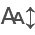

In [1]:
import networkx as nx
import matplotlib.pyplot as plt

from matplotlib_venn import venn2

import matplotlib.patches as mpatches

import pandas as pd
import numpy as np

from scipy.stats import pearsonr 
from joblib import Parallel, delayed

# import urllib.request
import fastobo
import json

import goatools
from goatools.obo_parser import GODag

import itables.options as opt
from itables import init_notebook_mode, show
from itables.downsample import as_nbytes, nbytes
from itables.sample_dfs import get_indicators

init_notebook_mode(all_interactive=False)
opt.maxBytes = "128KB"

import seaborn as sns

sns.set()
plt.style.use('default')
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap, BoundaryNorm

import matplotlib.cm as cm
import matplotlib.colors as mcolors

from collections import Counter

import glob
import inspect

import igraph as ig
from community import community_louvain as com
import random

import os

# Grafos

### Redes presentadas

In [3]:
# Definir los colores según el peso
def asignar_color(peso, colores_tuple):
	if peso == 1:
		return colores_tuple[0]
	elif peso == 2:
		return colores_tuple[1]
	elif peso == 0.5:
		return colores_tuple[2]
	else:
		return 'red'  # Opcional, para pesos no especificados
	
def asignar_colores_full(peso, colores_tuple):
	if peso == 1:
		return colores_tuple[0]
	elif peso == 2:
		return colores_tuple[1]
	elif peso == 0.5:
		return colores_tuple[2]
	elif peso == 0.3:
		return colores_tuple[3]
	elif peso == 0.1:
		return colores_tuple[4]
	else:
		return 'red'  # Opcional, para pesos no especificados

In [ ]:
# def assign_edge_colors(G):
#     edge_colors = {2: 'plum',
#         -2: 'lightseagreen'}

#     nx.set_edge_attributes(G, {e: edge_colors.get(G[e[0]][e[1]]['weight'], 'black') for e in G.edges()}, 'color')

In [4]:
def gigante(G):
	componentes = nx.connected_components(G)
	componentes = list(componentes)
	componentes.sort(key=len, reverse=True)
	componente_gigante = G.subgraph(componentes[0])
	return componente_gigante

In [7]:
def edge_colors_funcion(red_pesada, colores_tuple = ('white', 'plum', 'lightseagreen')):
    # Obtener pesos de los enlaces
	pesos = [data['weight'] for _, _, data in red_pesada.edges(data=True)]

	# Asignar colores basados en los pesos
	if len(colores_tuple) == 3:
		colores = [asignar_color(p, colores_tuple) for p in pesos]
	else:
		colores = [asignar_colores_full(p, colores_tuple) for p in pesos]

	return colores

In [2]:
red_apms = nx.read_gpickle("apms.gpickle")
red_y2h = nx.read_gpickle("y2h.gpickle")

red_correlacion = nx.read_gpickle("red_pesada-0.9-sinAPMS.gpickle")

red_corrAP_6 = nx.read_gpickle("red_pesada-cota06.gpickle")
red_corrAP_9f = nx.read_gpickle("red_pesada-cota09+full.gpickle")

red_corrY2_6 = nx.read_gpickle("red_pesada_y2h-cota06.gpickle")
red_corrY2_9f = nx.read_gpickle("red_pesada_y2h-cota09+full.gpickle")

## APMS

In [17]:
gigante_red_pesada = gigante(red_apms)
edges = gigante_red_pesada.edges(data=True)

colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumspringgreen', 'coral')
pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

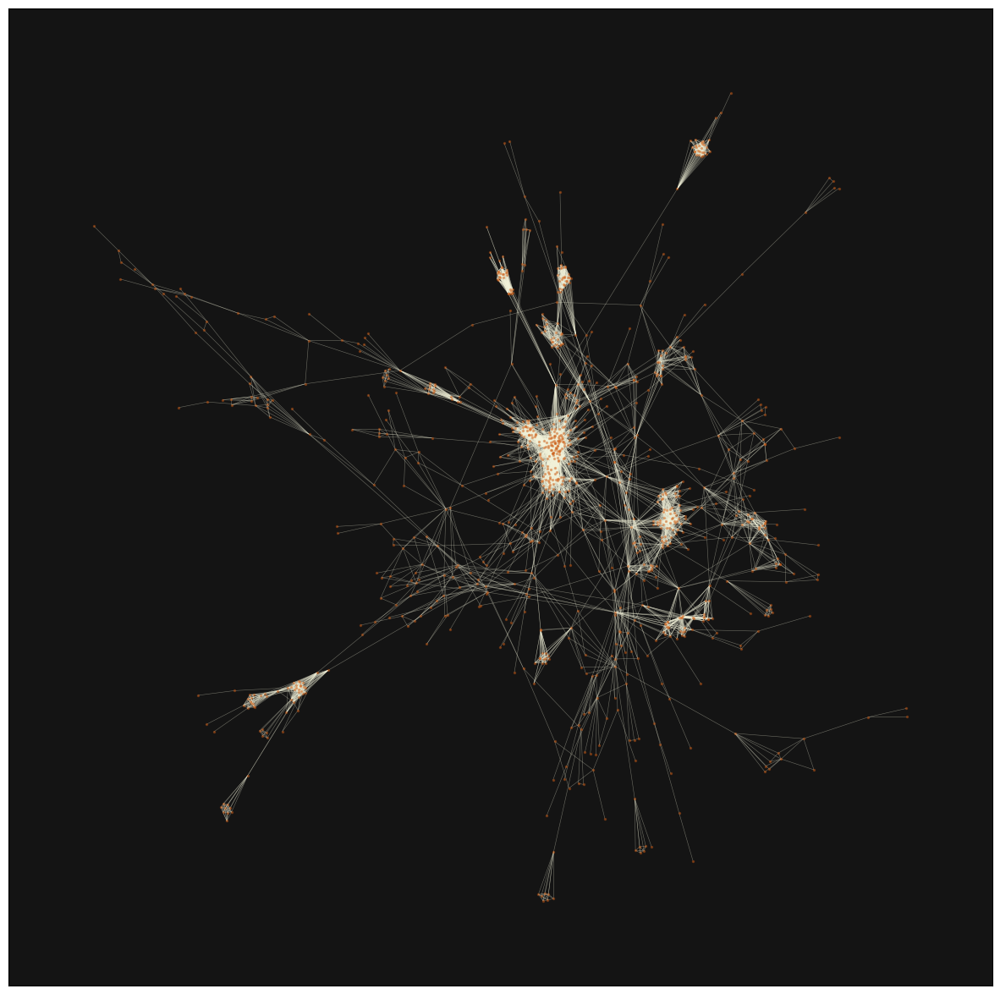

In [22]:


fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = '#cc5c14',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = 'beige', width = 0.4)

# if len(colores_tuple) == 5:
# 	plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces'),
# 						mpatches.Patch(color=colores_tuple[3], label='Positiva - ' + str(conteo[colores_tuple[3]]) + ' enlaces'),
# 						mpatches.Patch(color=colores_tuple[4], label='Negativa - ' + str(conteo[colores_tuple[4]]) + ' enlaces')], loc='upper right')
# else:
# 	plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [23]:
com_lv = com.best_partition(gigante_red_pesada)#, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 20
La modularidad de dicha partición es: 0.7607358078180805


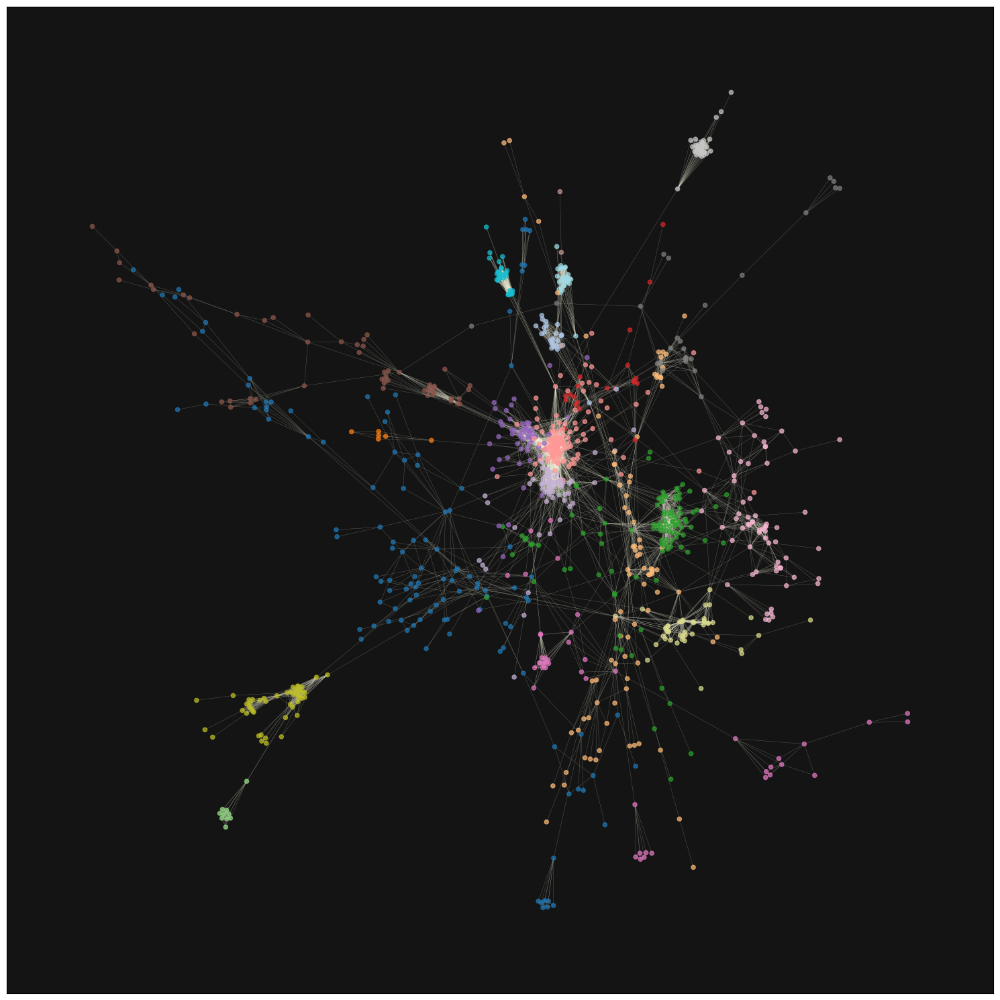

In [25]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

## Y2H

In [26]:
gigante_red_pesada = gigante(red_y2h)
edges = gigante_red_pesada.edges(data=True)

colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumspringgreen', 'coral')
pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

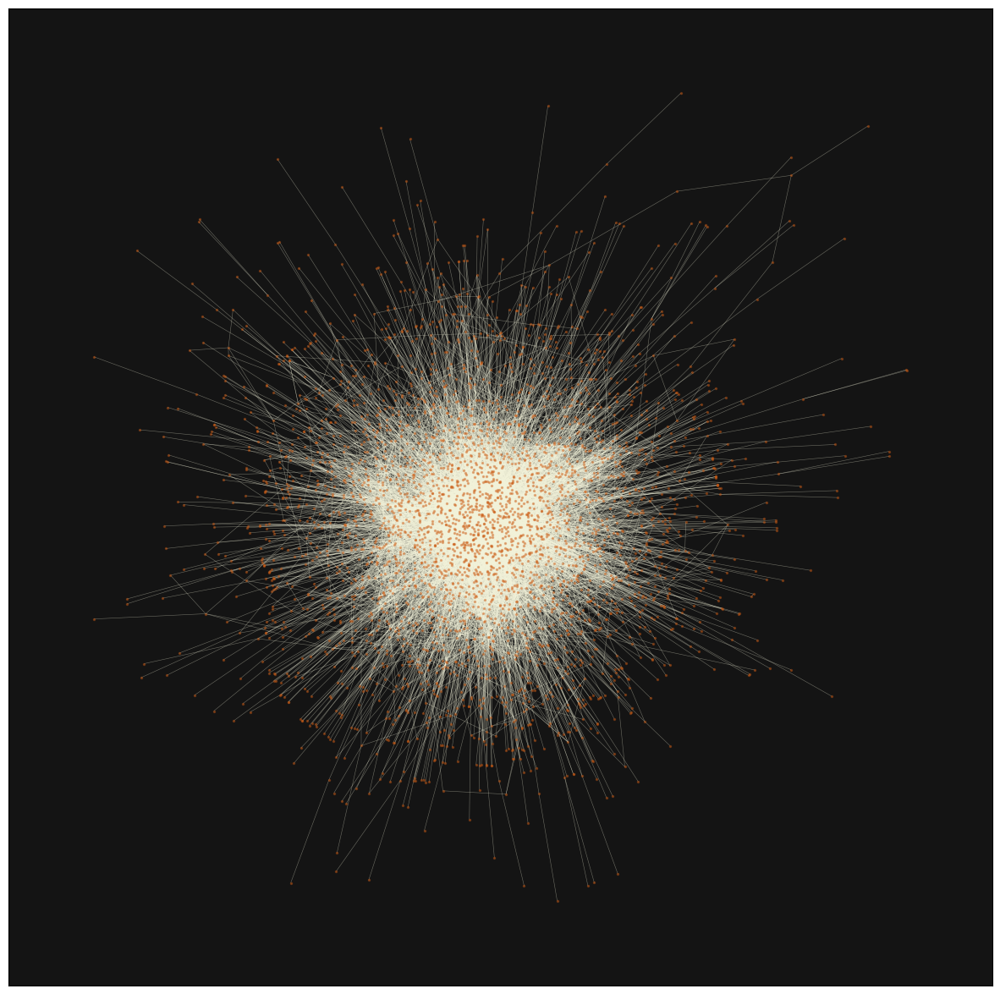

In [27]:
fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = '#cc5c14',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = 'beige', width = 0.4)

# if len(colores_tuple) == 5:
# 	plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces'),
# 						mpatches.Patch(color=colores_tuple[3], label='Positiva - ' + str(conteo[colores_tuple[3]]) + ' enlaces'),
# 						mpatches.Patch(color=colores_tuple[4], label='Negativa - ' + str(conteo[colores_tuple[4]]) + ' enlaces')], loc='upper right')
# else:
# 	plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
# 						mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [28]:
com_lv = com.best_partition(gigante_red_pesada)#, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 26
La modularidad de dicha partición es: 0.5124427698175952


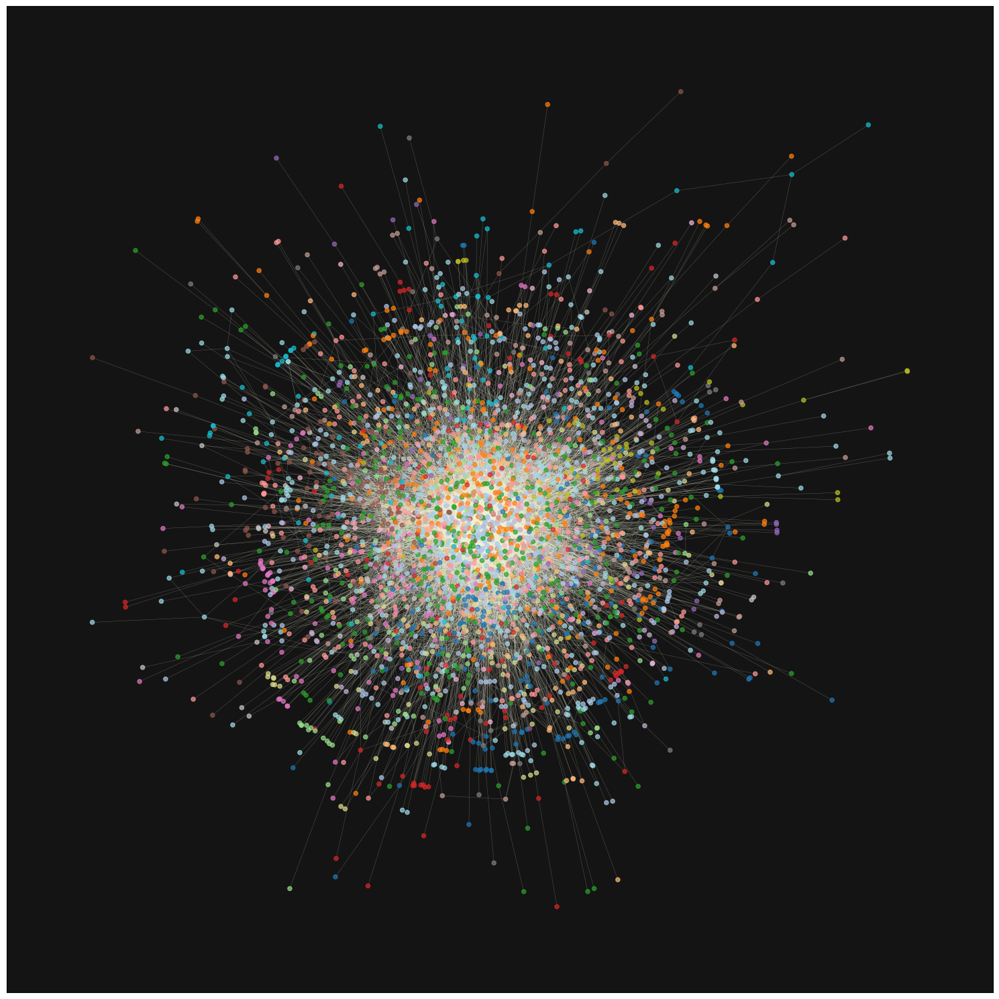

In [29]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

## Red Correlacion cota 0.9

In [30]:
gigante_red_pesada = gigante(red_correlacion)
edges = gigante_red_pesada.edges(data=True)

colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumspringgreen', 'coral')
pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

In [ ]:
# gigante_red_pesada.edges(data=True)


EdgeDataView([('YNL208W', 'YCL030C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YCR088W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YDL135C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YDR034C-A', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YDR461W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YEL060C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YGL157W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YGL242C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YGR043C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YHR071W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YIL111W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YIL116W', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YIR038C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YJL153C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YJR049C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YJR073C', {'weight': 1.0, 'color': 'plum'}), ('YNL208W', 'YJR142W', {'weight': 1.0, 'color': 'plum'})

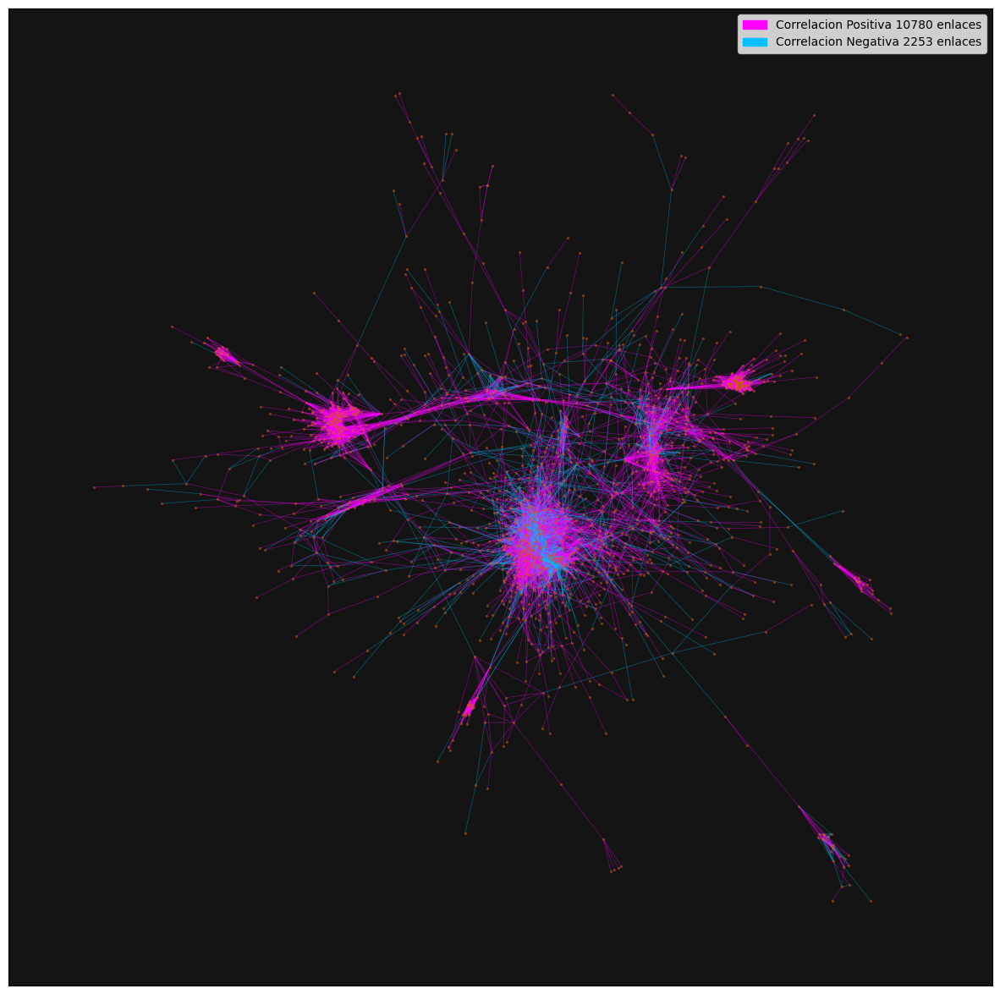

In [36]:
colores_tuple = ('magenta', 'orange', 'deepskyblue')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = '#cc5c14',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = colores, width = 0.5)


plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='Correlacion Positiva ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
					mpatches.Patch(color=colores_tuple[2], label='Correlacion Negativa ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [44]:
com_lv = com.best_partition(gigante_red_pesada, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 27
La modularidad de dicha partición es: 0.7625020635199585


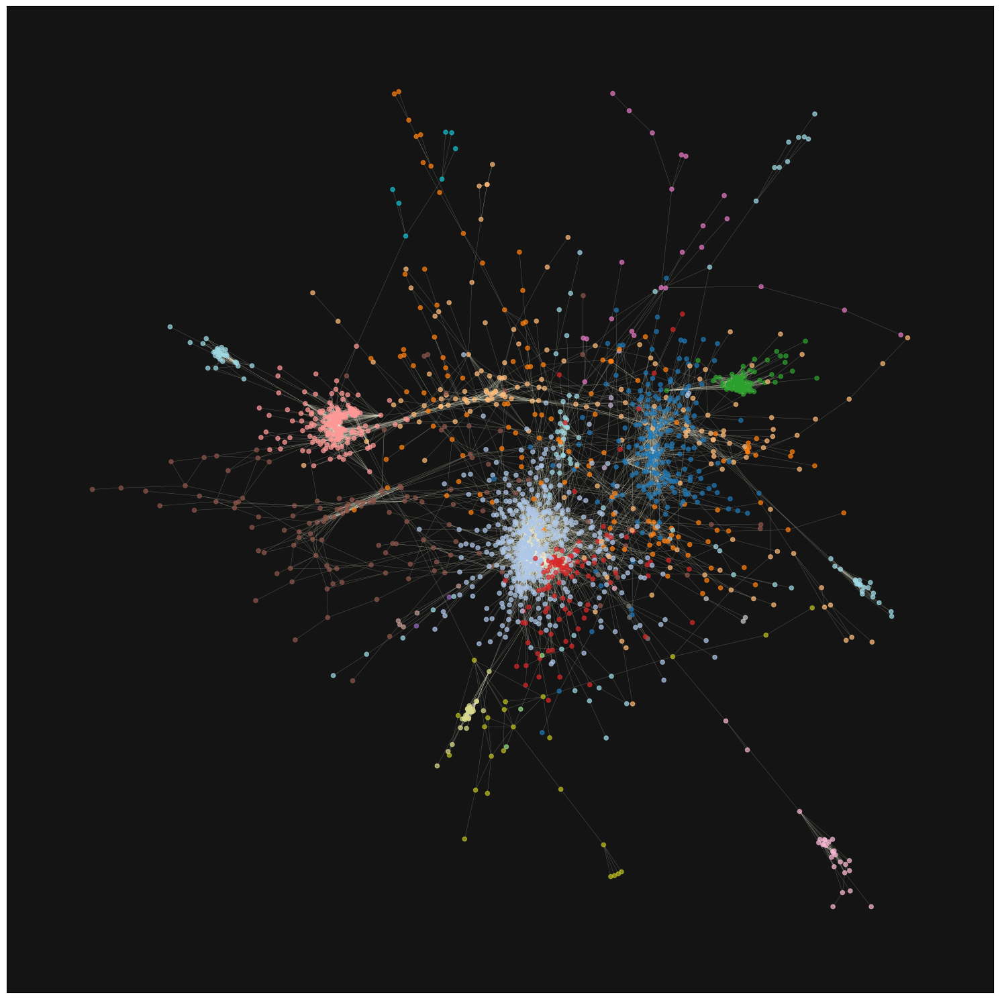

In [45]:
# fig, axs = plt.subplots(1, 1, figsize = (15, 15))

# for i, ax in enumerate(fig.axes):
# 	ax.set_facecolor('#141414')  # Cambiar color de background
# 	nx.draw_networkx_nodes(gigante_red_pesada,
# 						   pos = pos_layout,
# 						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
# 						   ax = ax,
# 						   node_size = 20, alpha = 0.7)
# 	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
# 	ax.axis('on')
	
	
colores_tuple = ('magenta', 'orange', 'deepskyblue')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')

# plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='Correlacion Positiva ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
# 					mpatches.Patch(color=colores_tuple[2], label='Correlacion Negativa ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

plt.tight_layout()

## Red APMS + Correlacion con cota en 0.6

In [46]:
gigante_red_pesada = gigante(red_corrAP_6)
edges = gigante_red_pesada.edges(data=True)

colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumspringgreen', 'coral')
pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

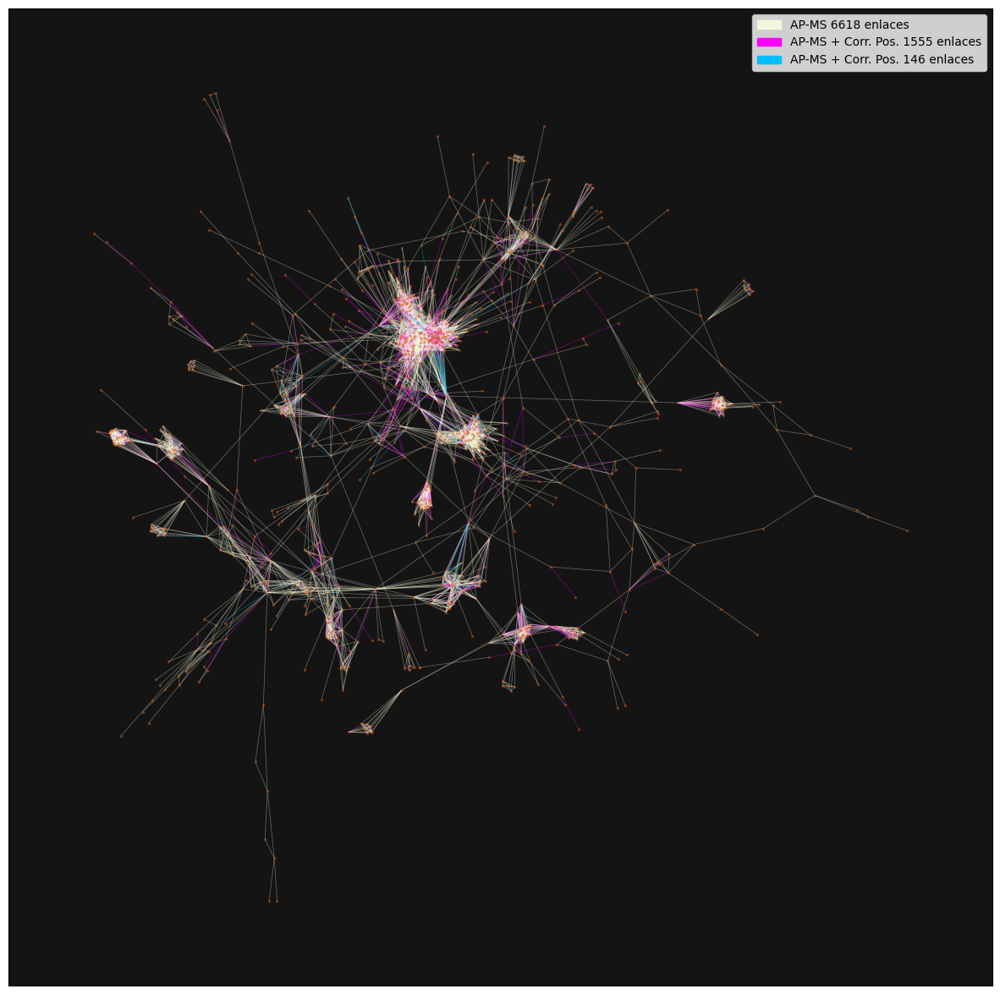

In [ ]:
colores_tuple = ('beige', 'magenta', 'deepskyblue')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = '#cc5c14',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = colores, width = 0.5)


plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
					mpatches.Patch(color=colores_tuple[1], label='AP-MS + Corr. Pos. ' + str(conteo[colores_tuple[1]]) + ' enlaces'),
					mpatches.Patch(color=colores_tuple[2], label='AP-MS + Corr. Neg. ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [51]:
com_lv = com.best_partition(gigante_red_pesada, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 23
La modularidad de dicha partición es: 0.7599376024370535


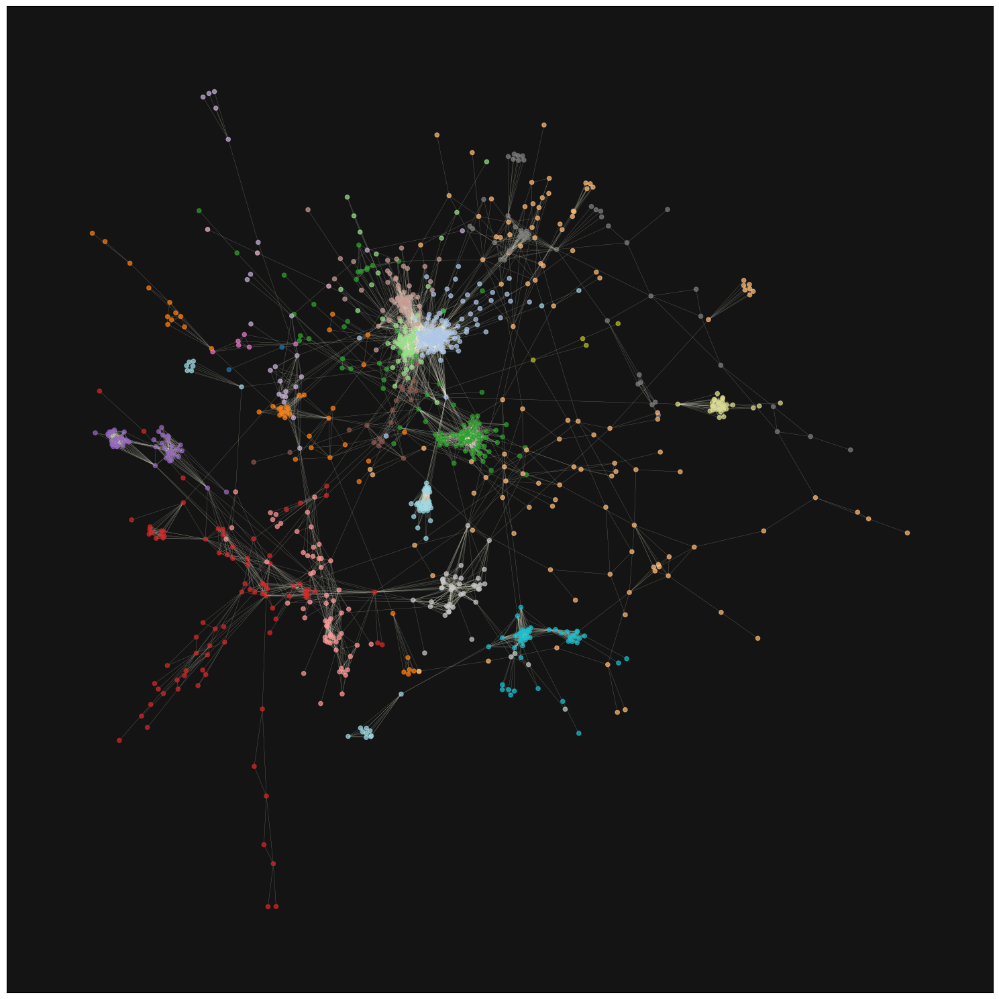

In [54]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

## Red APMS + Correlacion con cota 0.9 + enlaces solo Corr

In [55]:
gigante_red_pesada = gigante(red_corrAP_9f)

colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumspringgreen', 'coral')
pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

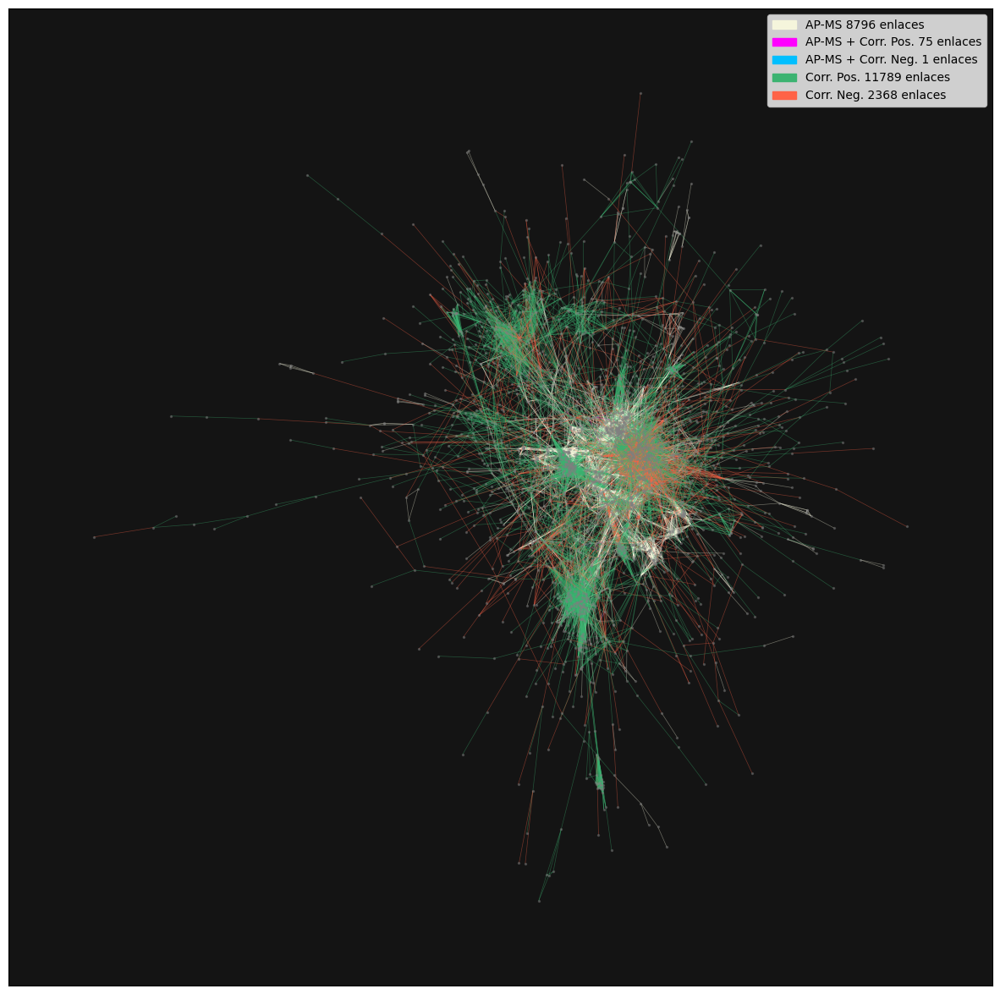

In [62]:
colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumseagreen', 'tomato')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = 'grey',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = colores, width = 0.5)

plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[1], label='AP-MS + Corr. Pos. ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[2], label='AP-MS + Corr. Neg. ' + str(conteo[colores_tuple[2]]) + ' enlaces'),
						mpatches.Patch(color=colores_tuple[3], label='Corr. Pos. ' + str(conteo[colores_tuple[3]]) + ' enlaces'),
						mpatches.Patch(color=colores_tuple[4], label='Corr. Neg. ' + str(conteo[colores_tuple[4]]) + ' enlaces')], loc='upper right')

In [63]:
com_lv = com.best_partition(gigante_red_pesada, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 39
La modularidad de dicha partición es: 0.7943215330312094


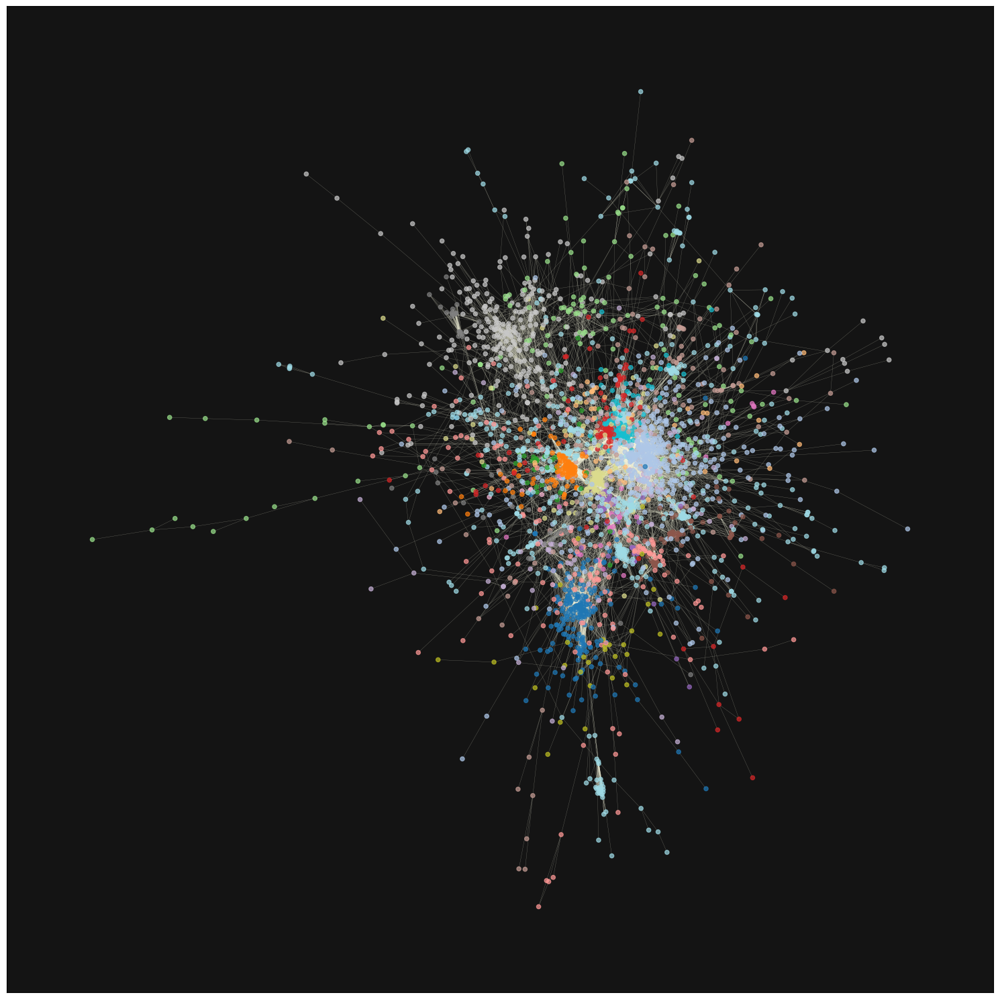

In [64]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

## Red Y2H + Correlacion con cota 0.6

In [65]:
gigante_red_pesada = gigante(red_corrY2_6)

pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

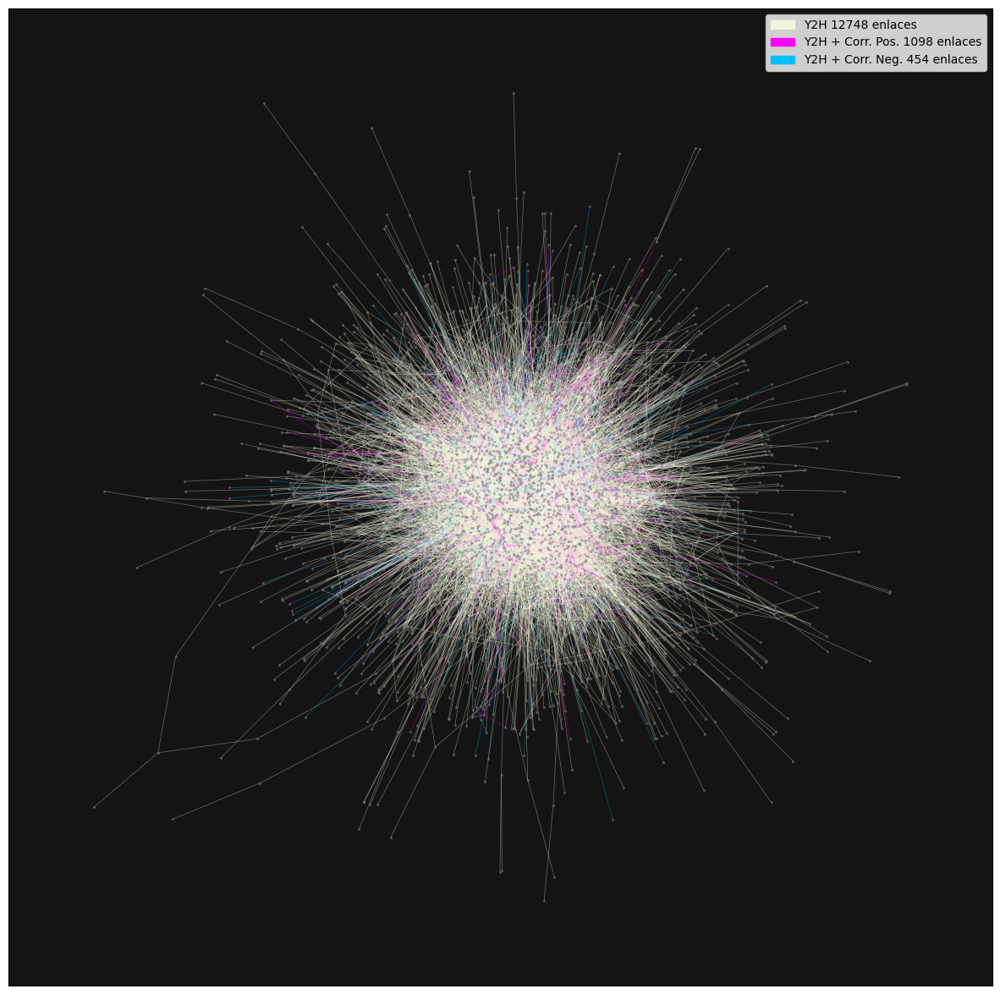

In [66]:
colores_tuple = ('beige', 'magenta', 'deepskyblue')#, 'mediumseagreen', 'tomato')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = 'grey',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = colores, width = 0.5)

plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='Y2H ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[1], label='Y2H + Corr. Pos. ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[2], label='Y2H + Corr. Neg. ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [67]:
com_lv = com.best_partition(gigante_red_pesada, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 28
La modularidad de dicha partición es: 0.524294847887511


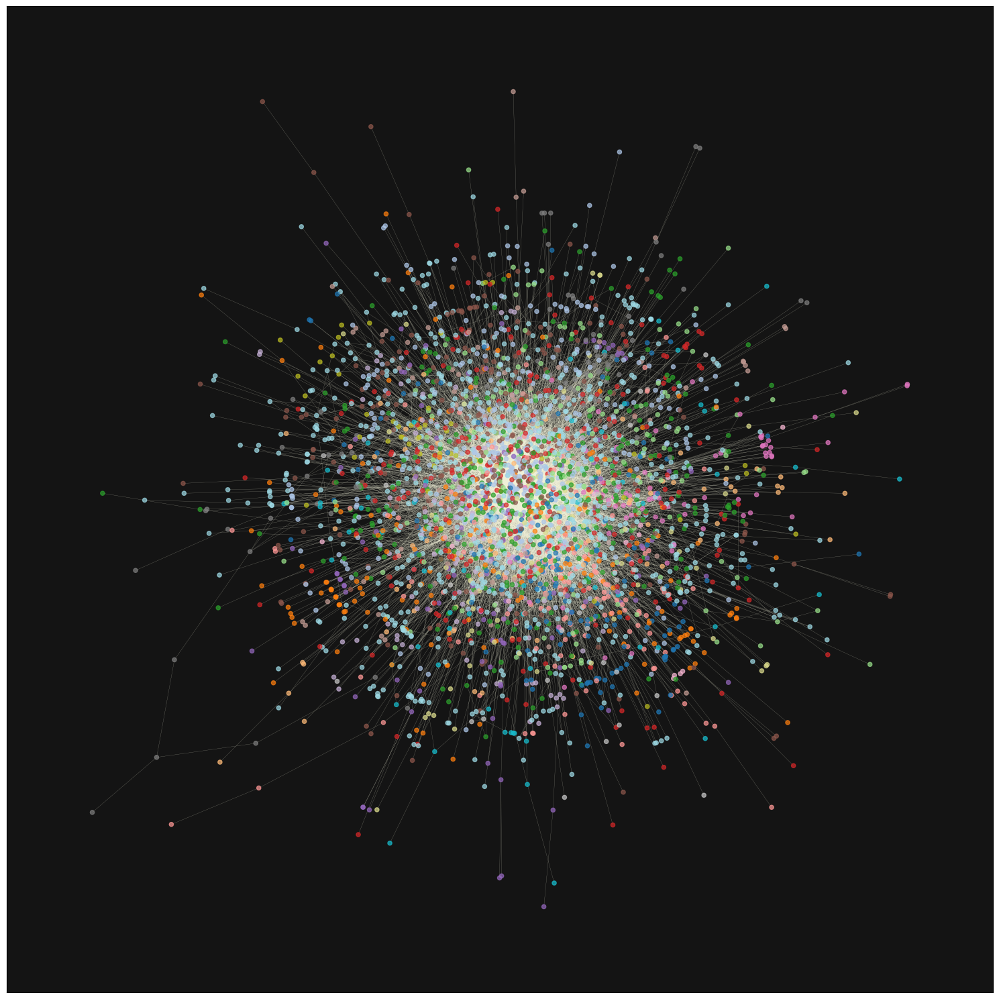

In [68]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

## Red Y2H + Correlacion con cota 0.9 + enlaces solo Corr

In [69]:
gigante_red_pesada = gigante(red_corrY2_9f)

pos_layout = nx.spring_layout(gigante_red_pesada, seed=42)  # Layout para la posición de los nodos

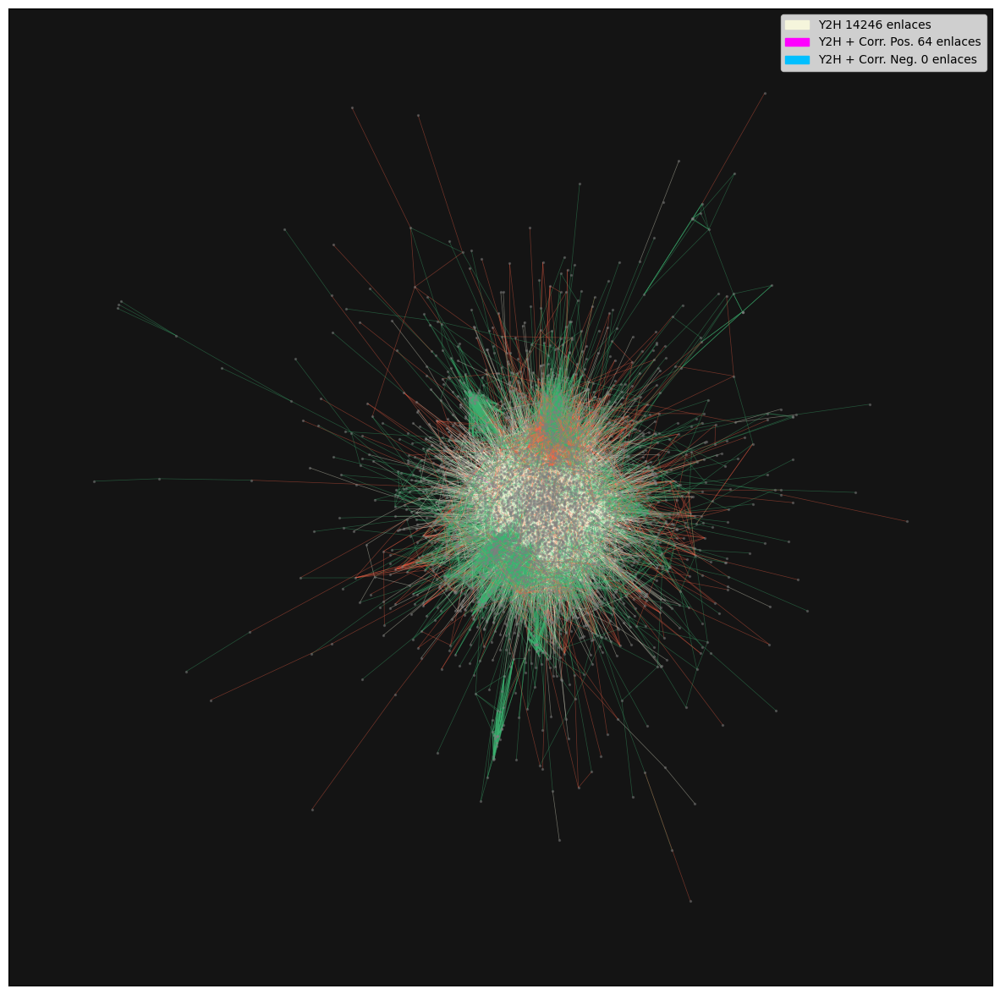

In [70]:
colores_tuple = ('beige', 'magenta', 'deepskyblue', 'mediumseagreen', 'tomato')
colores = edge_colors_funcion(gigante_red_pesada, colores_tuple = colores_tuple)
conteo = Counter(colores)

fig, axes = plt.subplots(1, 1, figsize = (15,15))

for i, ax in enumerate(fig.axes):

	ax.set_facecolor('#141414') 
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = 'grey',
						   ax = ax,
						   node_size = 2, alpha = 0.4)
	
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .4, edge_color = colores, width = 0.5)

plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='Y2H ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[1], label='Y2H + Corr. Pos. ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
						mpatches.Patch(color=colores_tuple[2], label='Y2H + Corr. Neg. ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')

In [71]:
com_lv = com.best_partition(gigante_red_pesada, weight='weight')
print('Louvain')
print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
print(f'La modularidad de dicha partición es: {com.modularity(com_lv, gigante_red_pesada)}')

Louvain
La cantidad de comunas que maximiza la modularidad es: 28
La modularidad de dicha partición es: 0.530955210327905


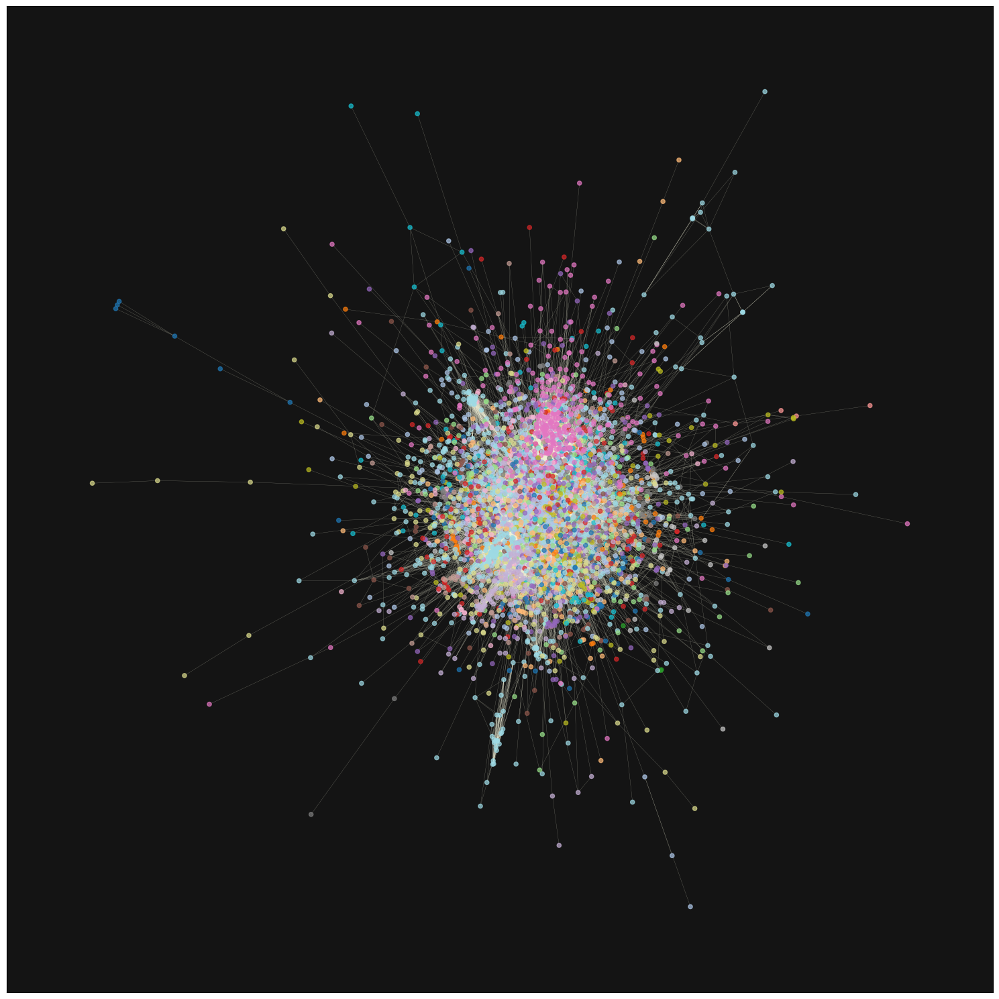

In [72]:
fig, axs = plt.subplots(1, 1, figsize = (15, 15))

for i, ax in enumerate(fig.axes):
	ax.set_facecolor('#141414')  # Cambiar color de background
	nx.draw_networkx_nodes(gigante_red_pesada,
						   pos = pos_layout,
						   node_color = [plt.get_cmap('tab20')(com_lv[v]) for v in gigante_red_pesada.nodes()],
						   ax = ax,
						   node_size = 20, alpha = 0.7)
	nx.draw_networkx_edges(gigante_red_pesada, pos = pos_layout, ax = ax, alpha = .5, edge_color = 'beige', width = 0.2)
	ax.axis('on')
	
	plt.tight_layout()

# Subredes

In [102]:
def aplicar_louivan(red, resolucion = 1, show_salida = False):# Louivan
	com_lv = com.best_partition(red, weight='weight', resolution = resolucion)

	# print('Louvain')
	print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')

	print(f'La modularidad de dicha partición es: {com.modularity(com_lv, red)}')
	
	if show_salida:
		# Agrupamos los nodos por comunidad
		comunidades = {}
		for nodo, comunidad in com_lv.items():
			if comunidad not in comunidades:
				comunidades[comunidad] = []
			comunidades[comunidad].append(nodo)

		# Imprimimos las comunidades en el formato solicitado
		for comunidad, nodos in comunidades.items():
			print(f'[{comunidad}] {", ".join(nodos)}')

	return com_lv

In [80]:
def guardar_louivan(red, path, resolucion = 1):
	partition = aplicar_louivan(red, resolucion = resolucion)

	comunidades = {}
	for nodo, comunidad in partition.items():
		if comunidad not in comunidades:
			comunidades[comunidad] = []
		comunidades[comunidad].append(nodo)
		
	subgrafos = {}
	for comunidad, nodos in comunidades.items():
		subgrafo = red.subgraph(nodos).copy()
		subgrafos[comunidad] = subgrafo

		# Guardar cada subgrafo en formato GraphML (o el formato deseado)
		nx.write_graphml(subgrafo, path+f"/subgrafo_comunidad_{comunidad}.graphml")

## Red APMS + Correlacion con cota en 0.6

In [112]:
red_pesada = red_corrAP_6
red_evaluar = gigante(red_pesada)
path__ = '../../Datos/subgrafos/apms/standard/06entera/Gigante'
guardar_louivan(red_evaluar, path__, 1)

La cantidad de comunas que maximiza la modularidad es: 24
La modularidad de dicha partición es: 0.7573291515649748


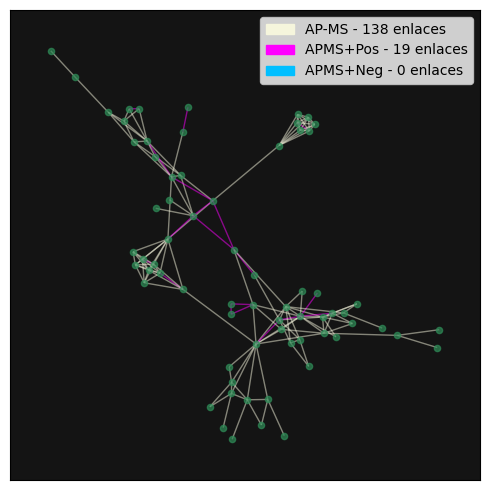

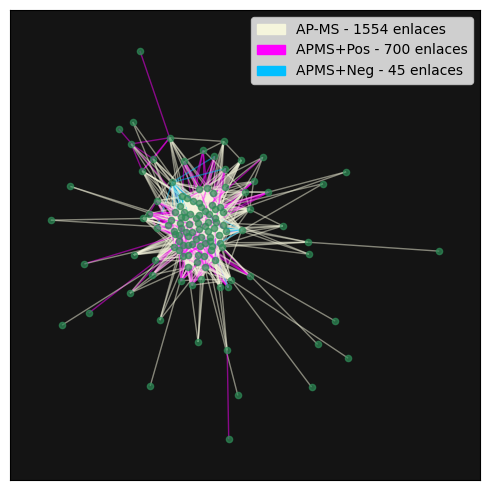

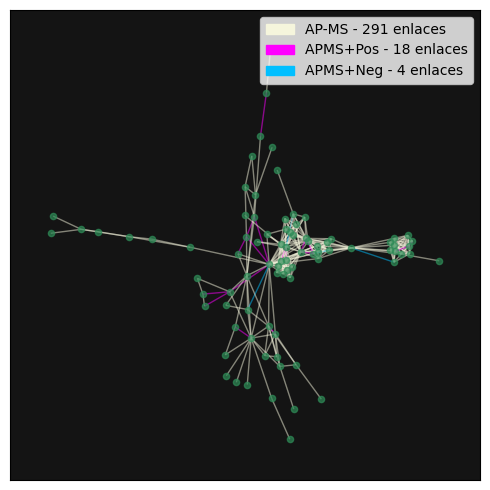

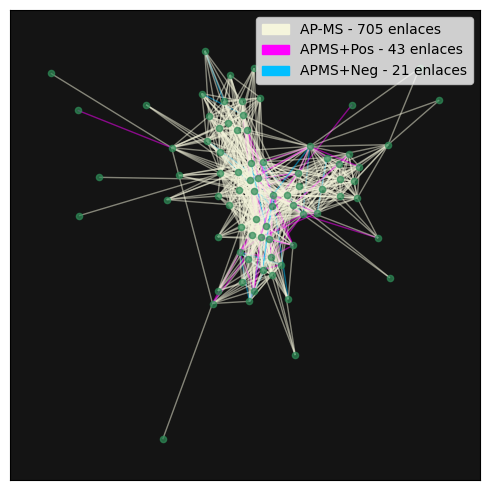

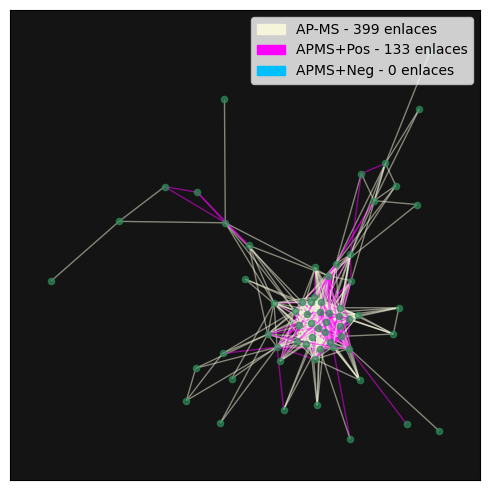

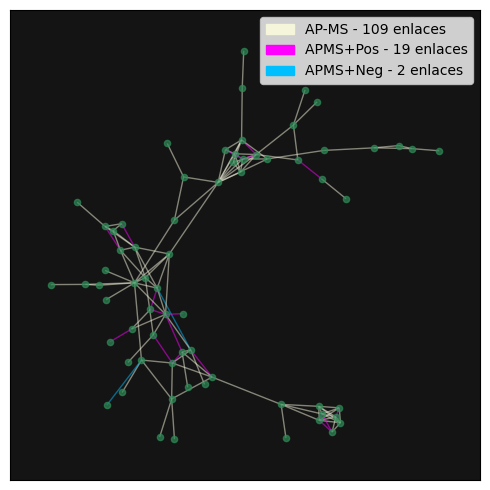

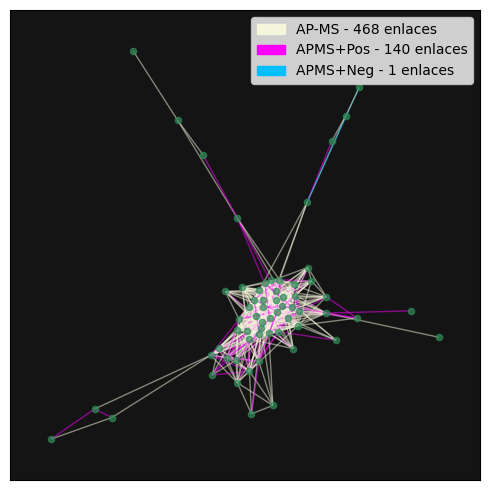

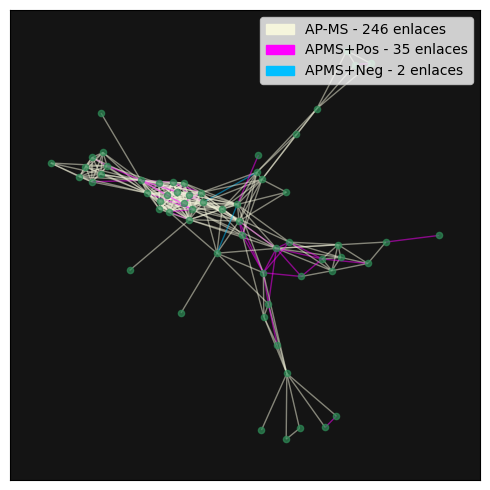

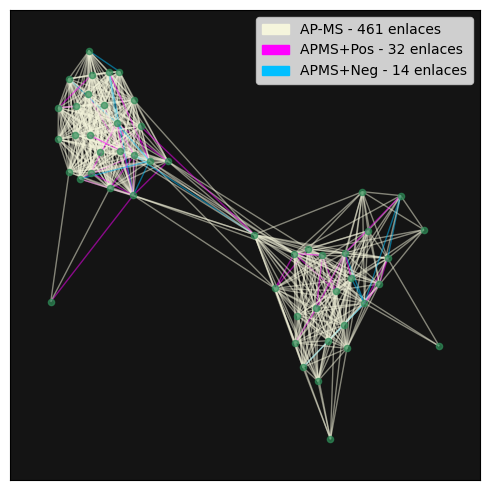

In [ ]:
grafitos = sorted(list(glob.glob(path__+'/subgrafo_comunidad_*.graphml')))

for grafo in grafitos:
	sub1 = nx.read_graphml(grafo)
	if len(sub1.nodes(data=True)) > 50:
		colores_tuple = ('beige', 'magenta', 'deepskyblue', 'green', 'coral')
		colores = edge_colors_funcion(sub1, colores_tuple = colores_tuple)
		conteo = Counter(colores)

		pos = nx.spring_layout(sub1, seed=42)

		fig, axs = plt.subplots(1, 1, figsize = (5,5))

		for i, ax in enumerate(fig.axes):
			ax.set_facecolor('#141414')  # Cambiar color de background
			nx.draw_networkx_nodes(sub1,
								pos = pos,
								node_color = 'seagreen',
								ax = ax,
								node_size = 20, alpha = 0.7)
			nx.draw_networkx_edges(sub1, pos = pos, ax = ax, alpha = .5, edge_color = colores, width = 1)
			ax.axis('on')
			plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')
				
			plt.tight_layout()
			plt.grid(False)
			plt.savefig('../../Graficos_ppt/Subgrafos/apms/'+grafo[-10:-8]+'.png', dpi = 300)

## Red APMS + Correlacion con cota 0.9 + full

In [103]:
red_pesada = red_corrAP_9f
red_evaluar = gigante(red_pesada)
path__ = '../../Datos/subgrafos/apms/standard/09full/Gigante'
guardar_louivan(red_evaluar, path__, 1)

La cantidad de comunas que maximiza la modularidad es: 37
La modularidad de dicha partición es: 0.7877155744432375


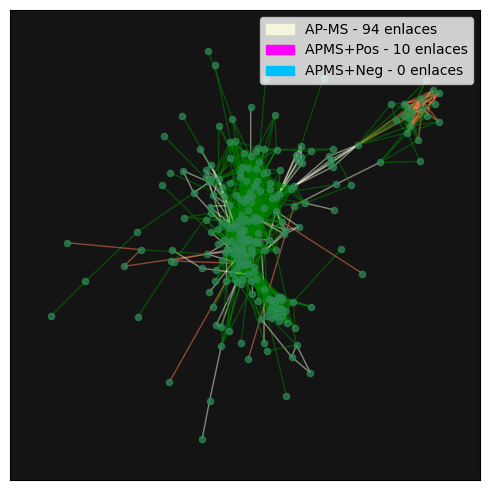

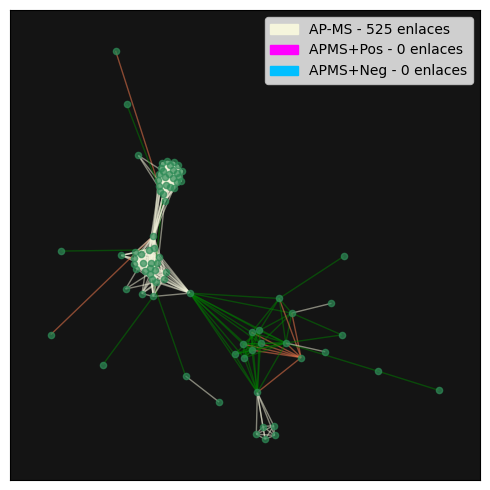

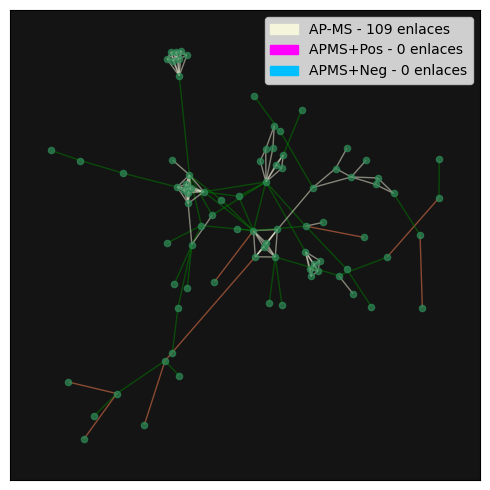

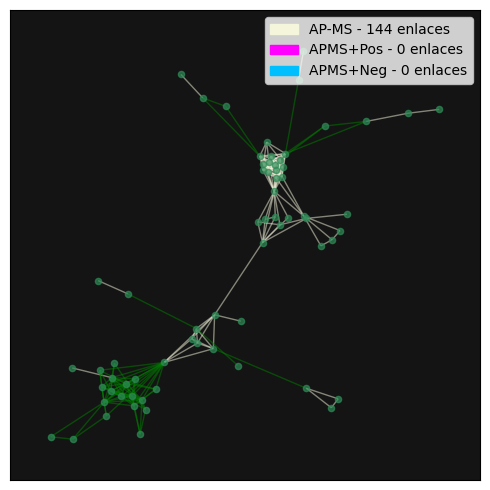

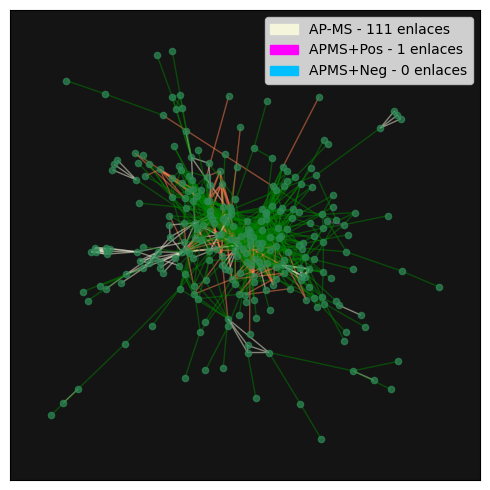

...

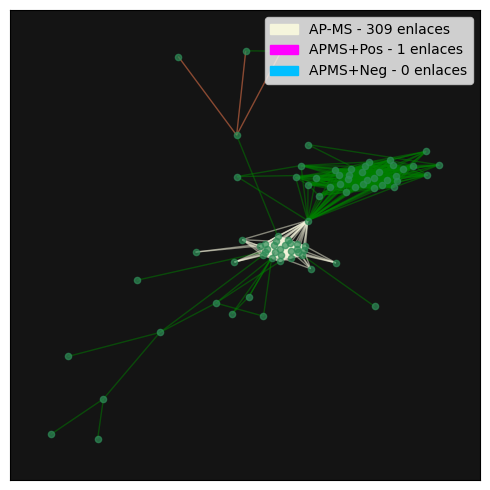

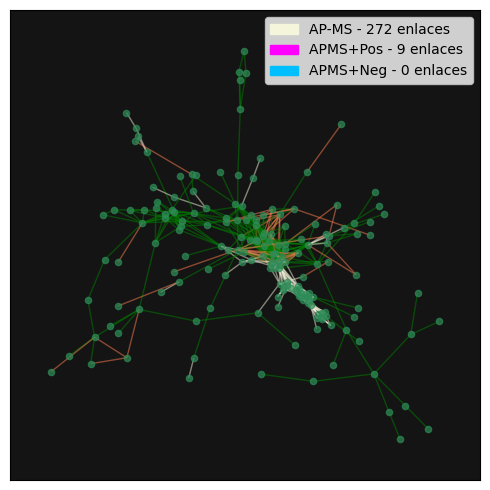

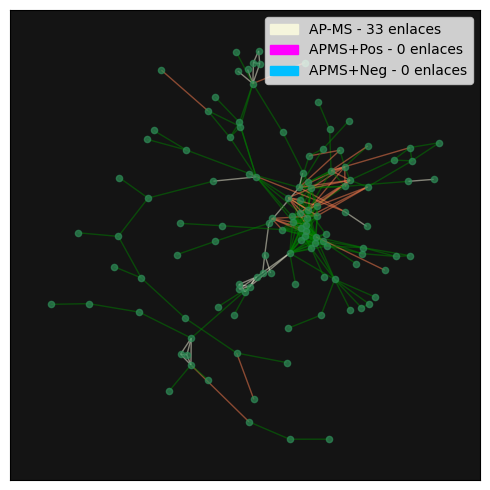

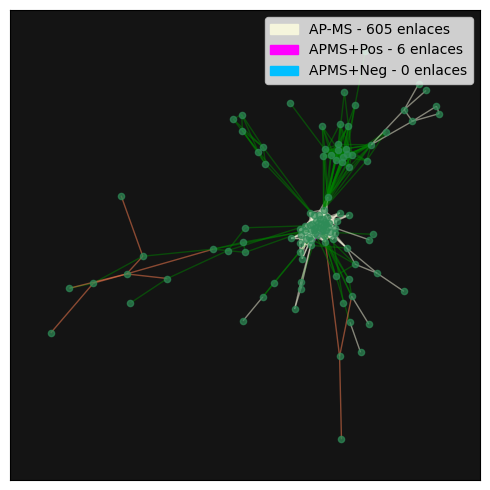

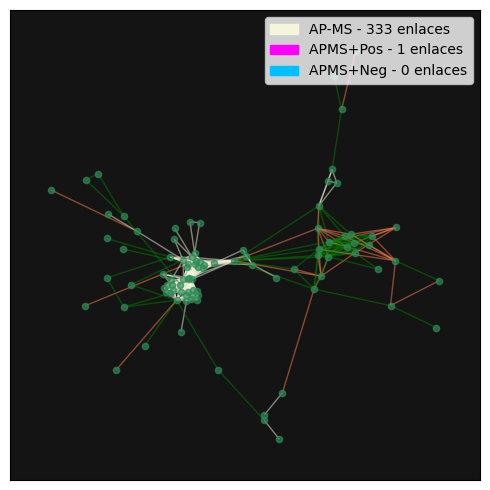

In [104]:
grafitos = sorted(list(glob.glob(path__+'/subgrafo_comunidad_*.graphml')))

for grafo in grafitos:
	sub1 = nx.read_graphml(grafo)
	if len(sub1.nodes(data=True)) > 50:
		colores_tuple = ('beige', 'magenta', 'deepskyblue', 'green', 'coral')
		colores = edge_colors_funcion(sub1, colores_tuple = colores_tuple)
		conteo = Counter(colores)

		pos = nx.spring_layout(sub1, seed=42)

		fig, axs = plt.subplots(1, 1, figsize = (5,5))

		for i, ax in enumerate(fig.axes):
			ax.set_facecolor('#141414')  # Cambiar color de background
			nx.draw_networkx_nodes(sub1,
								pos = pos,
								node_color = 'seagreen',
								ax = ax,
								node_size = 20, alpha = 0.7)
			nx.draw_networkx_edges(sub1, pos = pos, ax = ax, alpha = .5, edge_color = colores, width = 1)
			ax.axis('on')
			plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')
				
			plt.tight_layout()
			plt.grid(False)
			plt.savefig('../../Graficos_ppt/Subgrafos/apms/'+grafo[-10:-8]+'.png', dpi = 300)

## Red Correlacion con cota 0.9

In [105]:
red_pesada = red_correlacion
red_evaluar = gigante(red_pesada)
path__ = '../../Datos/subgrafos/apms/standard/09sinapms/Gigante'
guardar_louivan(red_evaluar, path__, 1)

La cantidad de comunas que maximiza la modularidad es: 20
La modularidad de dicha partición es: 0.7689184676311858


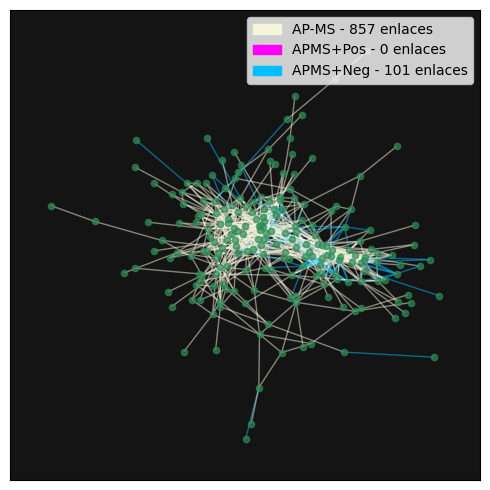

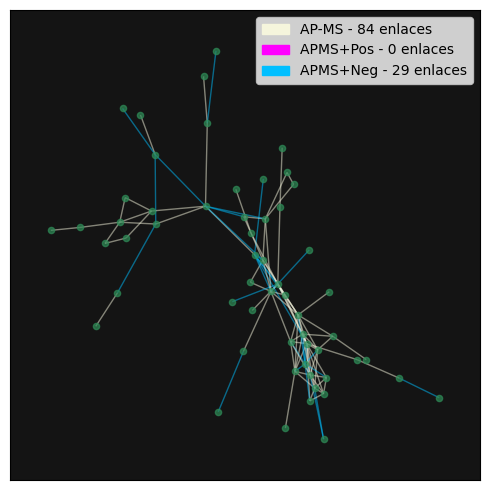

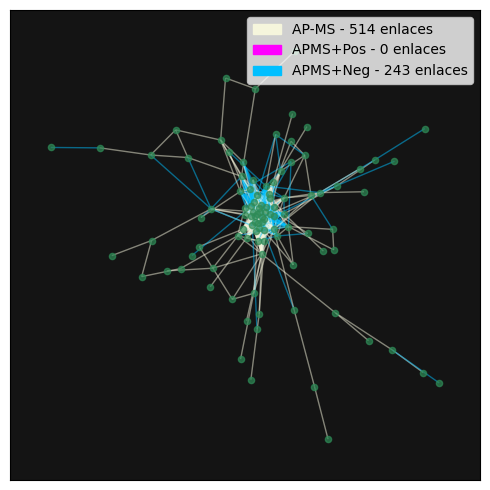

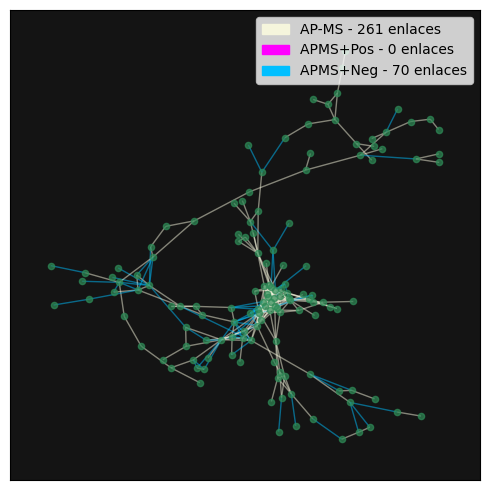

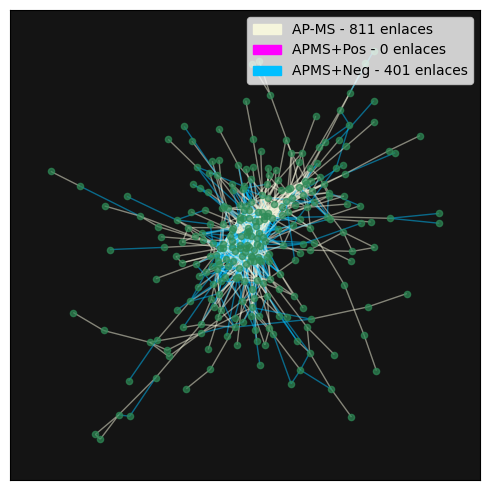

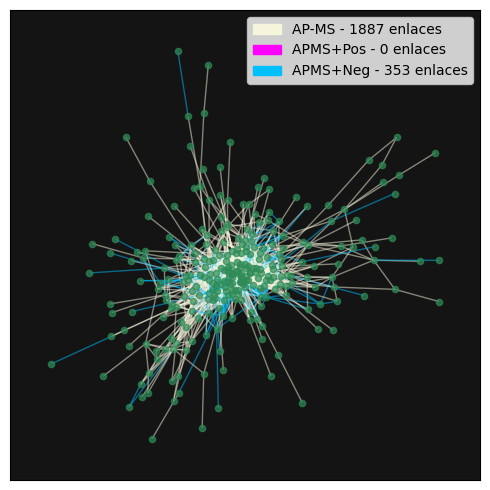

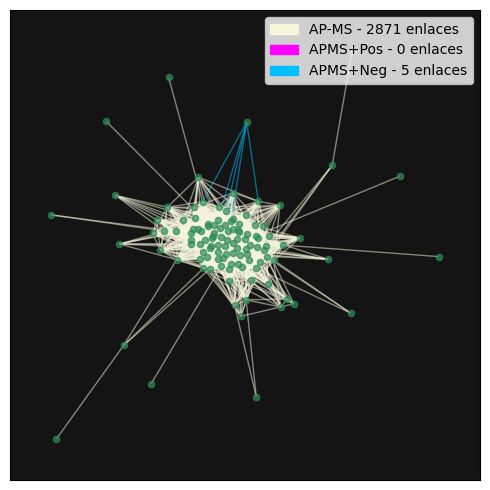

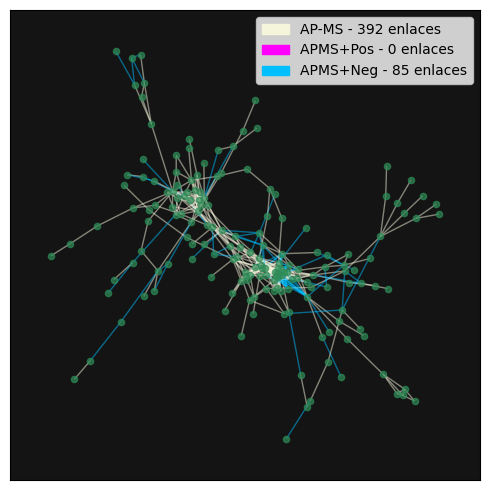

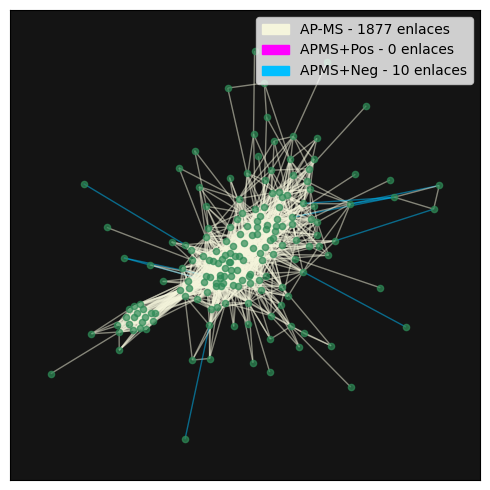

In [106]:
grafitos = sorted(list(glob.glob(path__+'/subgrafo_comunidad_*.graphml')))

for grafo in grafitos:
	sub1 = nx.read_graphml(grafo)
	if len(sub1.nodes(data=True)) > 50:
		colores_tuple = ('beige', 'magenta', 'deepskyblue', 'green', 'coral')
		colores = edge_colors_funcion(sub1, colores_tuple = colores_tuple)
		conteo = Counter(colores)

		pos = nx.spring_layout(sub1, seed=42)

		fig, axs = plt.subplots(1, 1, figsize = (5,5))

		for i, ax in enumerate(fig.axes):
			ax.set_facecolor('#141414')  # Cambiar color de background
			nx.draw_networkx_nodes(sub1,
								pos = pos,
								node_color = 'seagreen',
								ax = ax,
								node_size = 20, alpha = 0.7)
			nx.draw_networkx_edges(sub1, pos = pos, ax = ax, alpha = .5, edge_color = colores, width = 1)
			ax.axis('on')
			plt.legend(handles=[mpatches.Patch(color=colores_tuple[0], label='AP-MS - ' + str(conteo[colores_tuple[0]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[1], label='APMS+Pos - ' + str(conteo[colores_tuple[1]]) + ' enlaces'), 
								mpatches.Patch(color=colores_tuple[2], label='APMS+Neg - ' + str(conteo[colores_tuple[2]]) + ' enlaces')], loc='upper right')
				
			plt.tight_layout()
			plt.grid(False)
			plt.savefig('../../Graficos_ppt/Subgrafos/apms/'+grafo[-10:-8]+'.png', dpi = 300)

## Red APMS

In [107]:
red_pesada = red_apms
red_evaluar = gigante(red_pesada)
path__ = '../../Datos/subgrafos/apms/standard/apms/Gigante'
guardar_louivan(red_evaluar, path__, 1)

La cantidad de comunas que maximiza la modularidad es: 21
La modularidad de dicha partición es: 0.7609263699881865


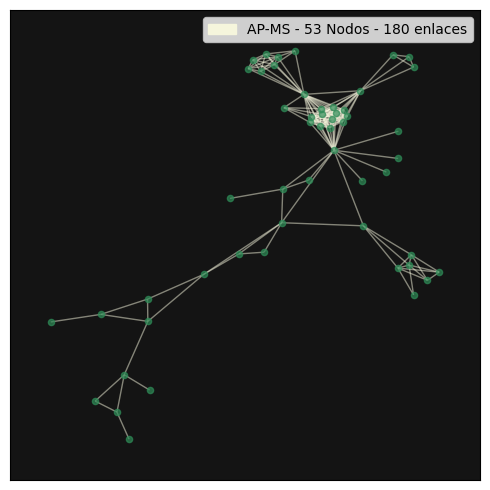

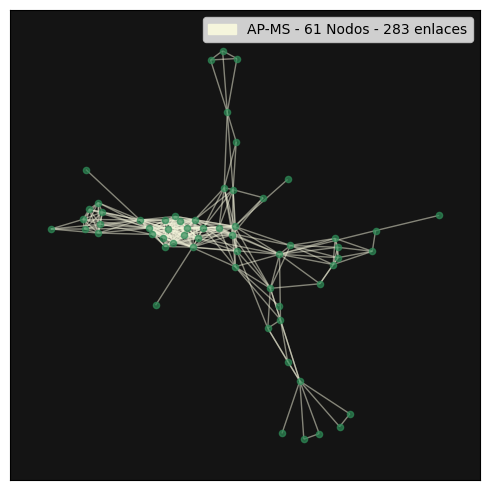

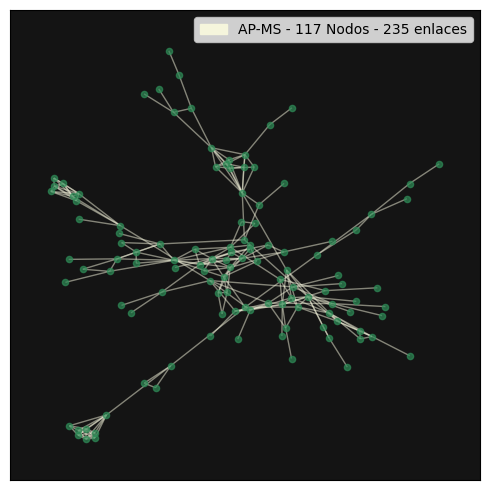

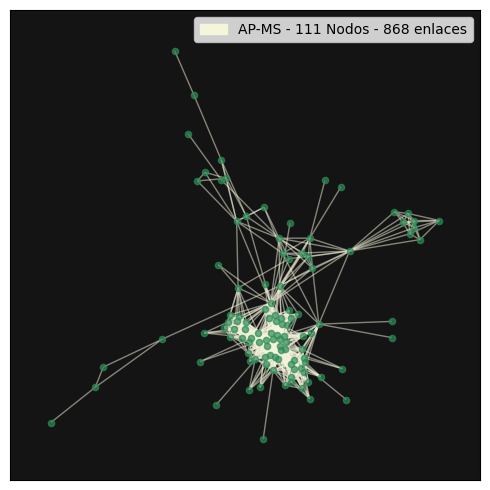

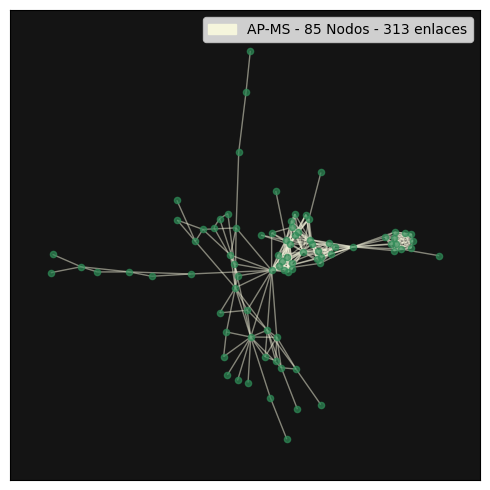

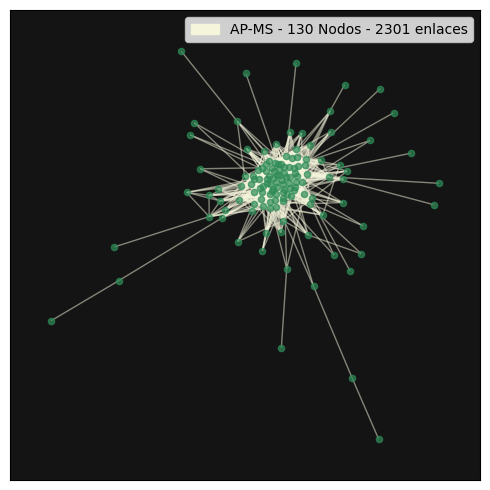

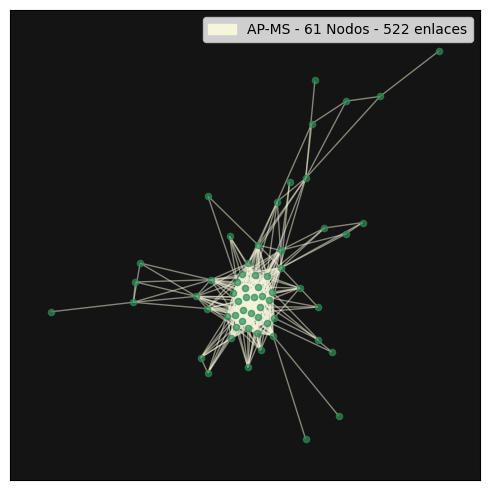

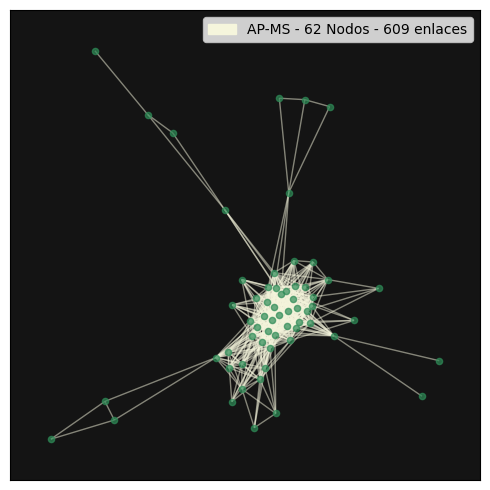

In [111]:
grafitos = sorted(list(glob.glob(path__+'/subgrafo_comunidad_*.graphml')))

for grafo in grafitos:
	sub1 = nx.read_graphml(grafo)
	if len(sub1.nodes(data=True)) > 50:
		colores_tuple = ('beige', 'magenta', 'deepskyblue', 'green', 'coral')
		# colores = edge_colors_funcion(sub1, colores_tuple = colores_tuple)
		colores = 'beige'
		# conteo = Counter(colores)

		pos = nx.spring_layout(sub1, seed=42)

		fig, axs = plt.subplots(1, 1, figsize = (5,5))

		for i, ax in enumerate(fig.axes):
			ax.set_facecolor('#141414')  # Cambiar color de background
			nx.draw_networkx_nodes(sub1,
								pos = pos,
								node_color = 'seagreen',
								ax = ax,
								node_size = 20, alpha = 0.7)
			nx.draw_networkx_edges(sub1, pos = pos, ax = ax, alpha = .5, edge_color = colores, width = 1)
			ax.axis('on')
			plt.legend(handles=[mpatches.Patch(color=colores, label='AP-MS - '+ str(sub1.number_of_nodes()) + ' Nodos - ' +
									   str(sub1.number_of_edges()) + ' enlaces')], loc='upper right')
				
			plt.tight_layout()
			plt.grid(False)
			plt.savefig('../../Graficos_ppt/Subgrafos/apms/'+grafo[-10:-8]+'.png', dpi = 300)